In [59]:
import os
import sys
import warnings

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import datetime as DT
from datetime import date
from datetime import datetime, timedelta

import matplotlib.dates as mdates

import helper_functions as hfs

warnings.simplefilter("ignore", UserWarning)
warnings.filterwarnings("ignore")

pd.set_option("display.max_columns", None)  # to see all columns of dataframe
pd.set_option("display.max_rows", None)  # to see all rows of dataframe
pd.set_option("display.max_colwidth", None)  # to see the full (un-truncated) dataframe field/cell value 



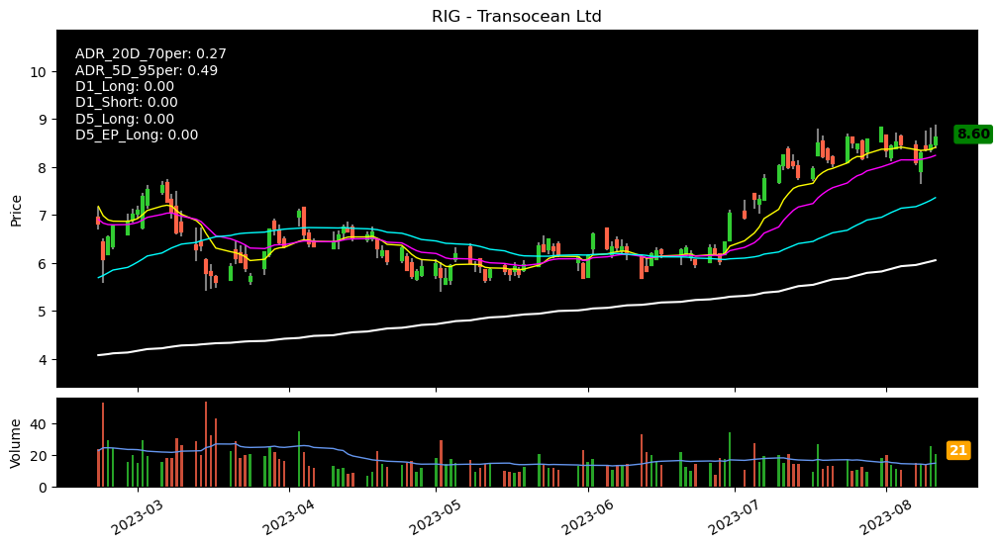

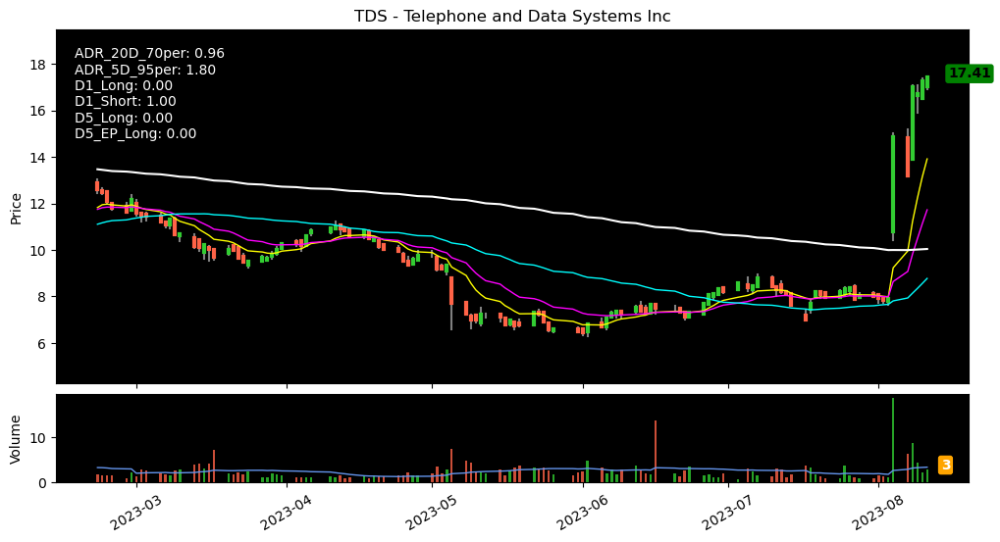

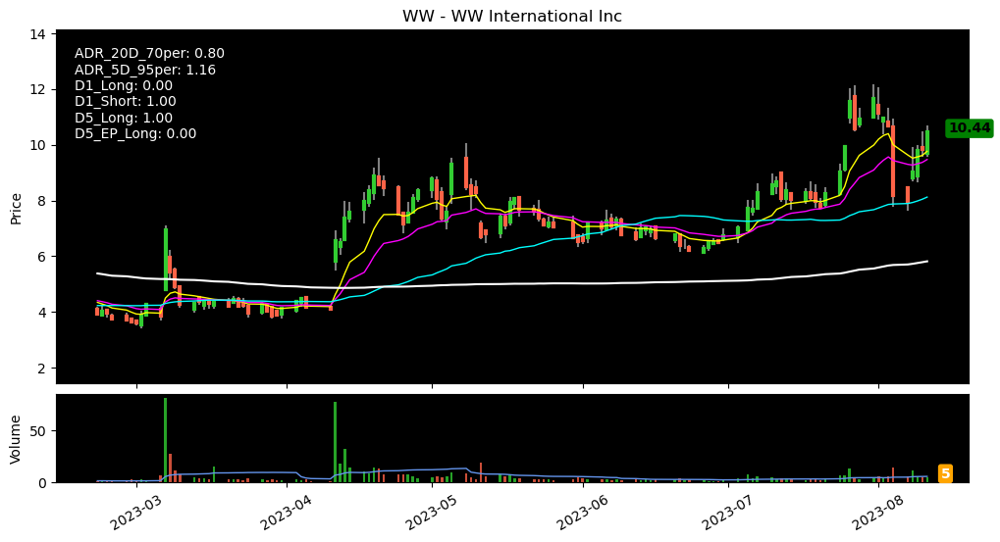

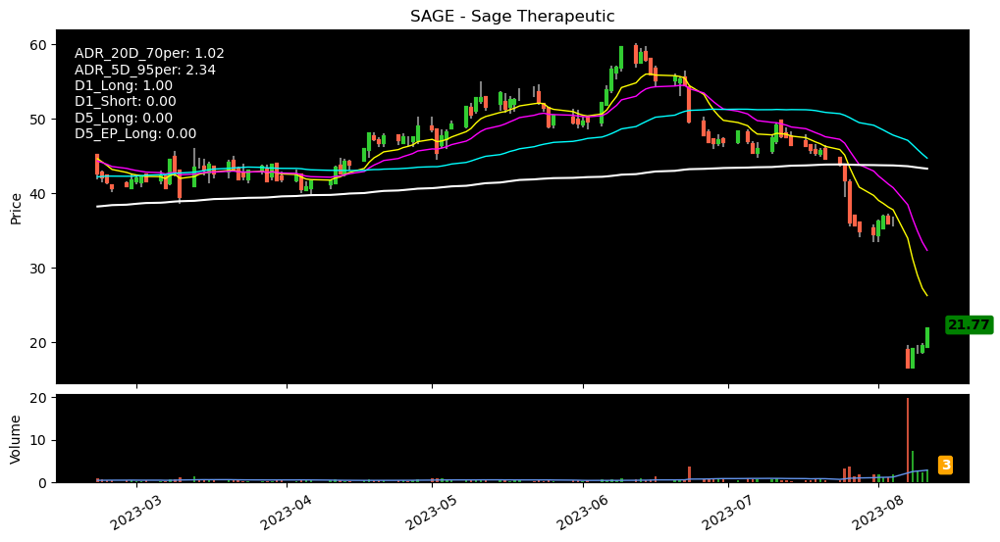

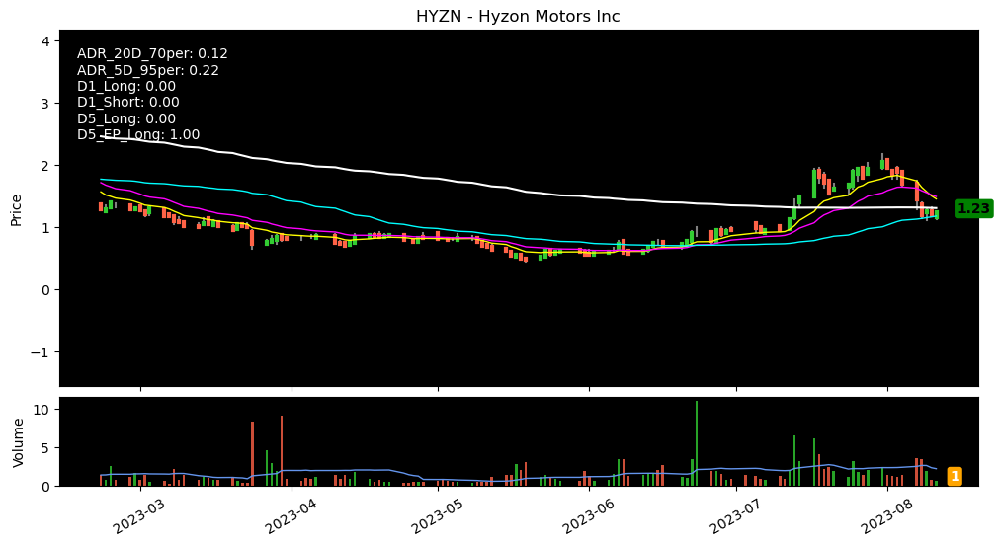

...

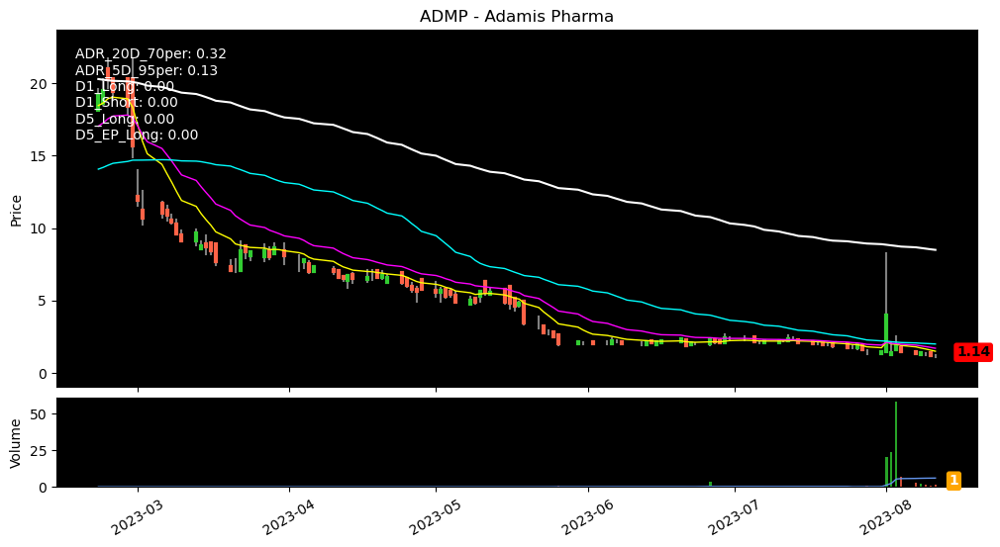

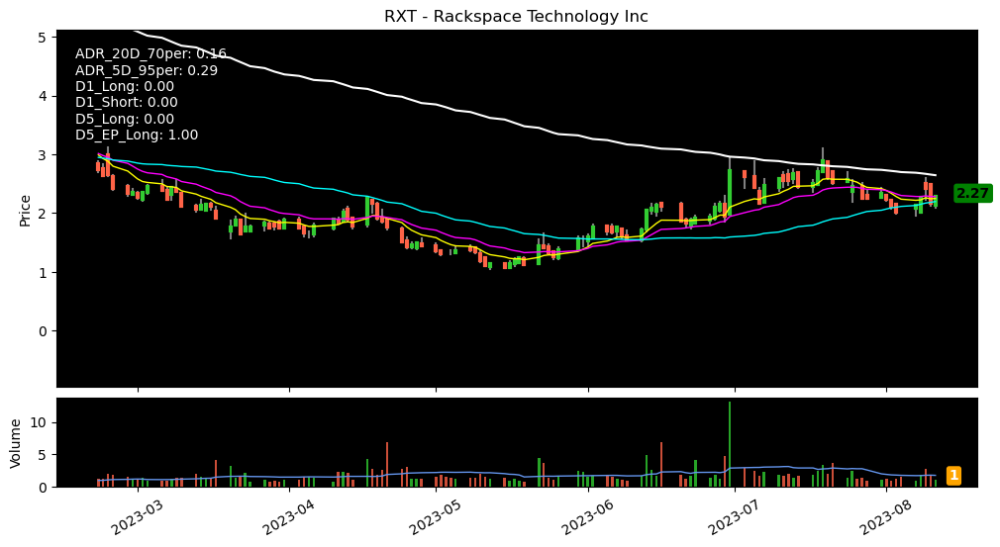

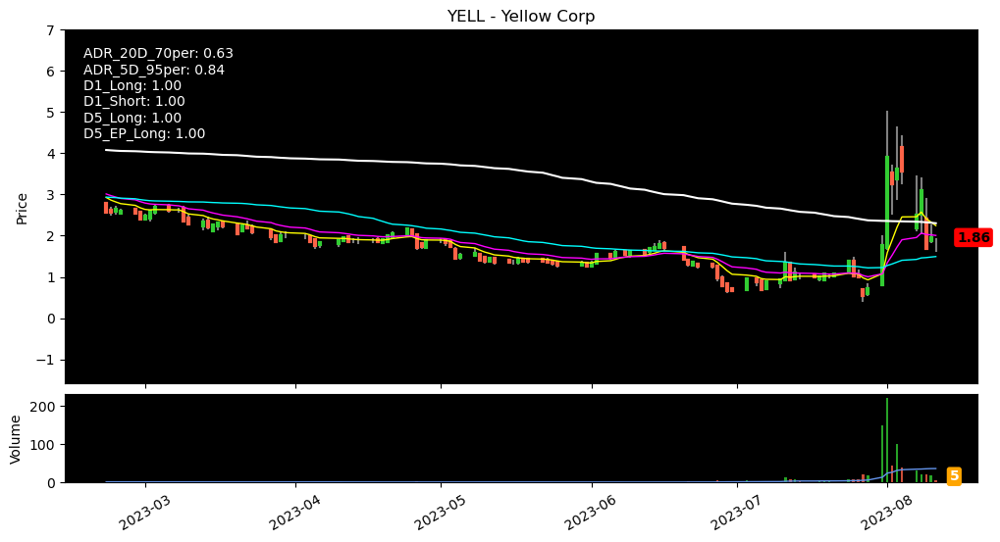

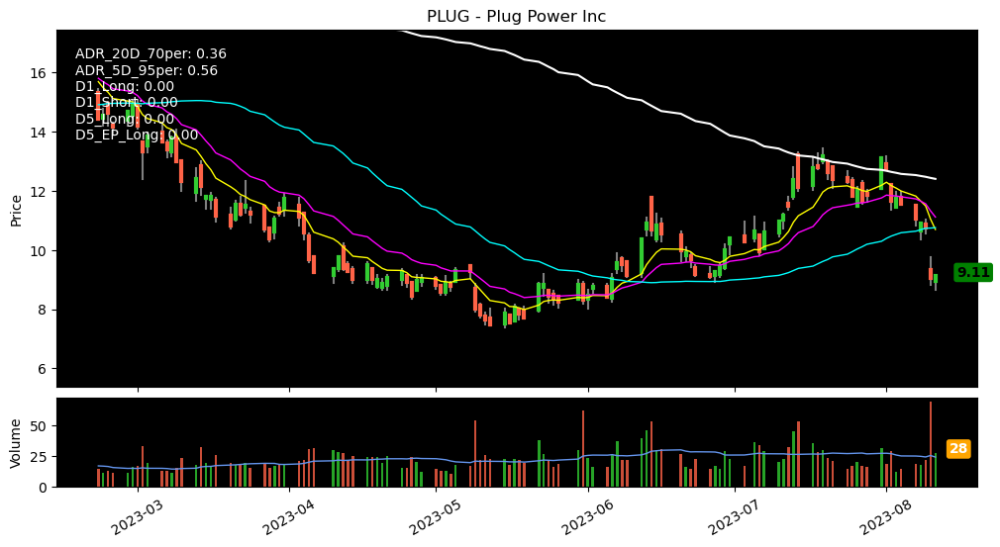

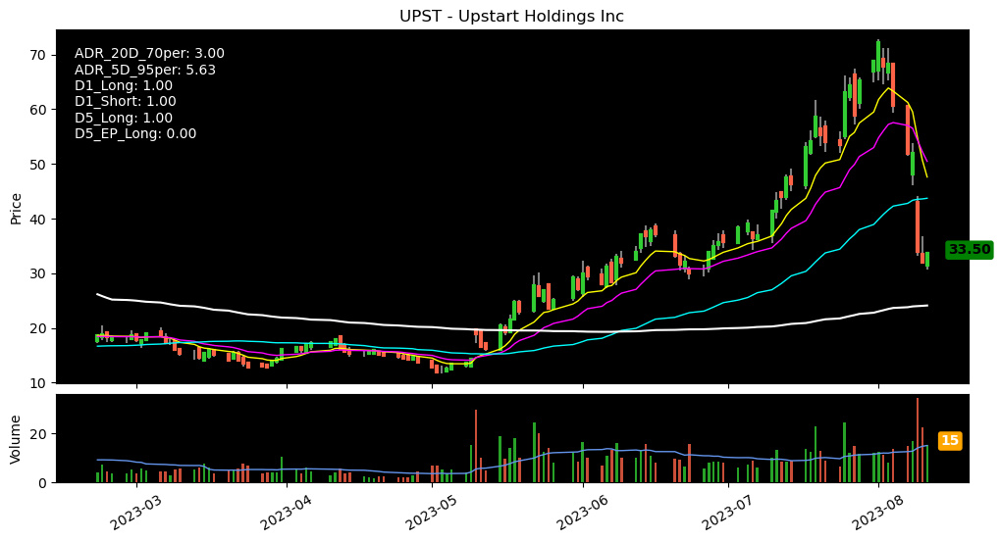

In [67]:
def plot_signal_on_candlestick_chart(df):
    df.set_index('Date', inplace=True)

    # Create a single subplot for the chart with adjusted height ratios
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 6), gridspec_kw={'height_ratios': [4, 1]})
    ax1.set_facecolor('black')  # Set black background
    ax2.set_facecolor('black')
    
    # Convert datetime to mdate format for plotting
    ax1.xaxis.set_major_formatter(mdates.DateFormatter('%y-%m-%d %H:%M'))

    clr = 'black'

    # Plot each candlestick and the dots for HH, HL, LL, and LH
    for index, row in df.iterrows():
        open_price = row['Adj_Open']
        close_price = row['Adj_Close']
        high_price = row['Adj_High']
        low_price = row['Adj_Low']

        if close_price < open_price:
            clr = 'tomato'
        elif close_price > open_price:
            clr = 'limegreen'
        else:
            continue

        # Plot the candlestick
        ax1.plot([index, index], [low_price, high_price], color="grey")
        ax1.plot([index, index], [open_price, close_price], color=clr, linewidth=3)

    # Plot EMA_10, EMA_20, Adj_Close_MA50, and Adj_Close_MA200 lines
    ax1.plot(df.index, df['EMA_10'], color='yellow', label='EMA_10',  linewidth=1)
    ax1.plot(df.index, df['EMA_20'], color='magenta', label='EMA_20',  linewidth=1)
    ax1.plot(df.index, df['Adj_Close_MA50'], color='cyan', label='Adj_Close_MA50', linewidth=1)
    ax1.plot(df.index, df['Adj_Close_MA200'], color='white', label='Adj_Close_MA200')

    # Calculate the color of volume bars
    volume_colors = np.where(df['Adj_Close'] > df['Adj_Open'], 'limegreen', 'tomato')

    # Plot volume bars in the bottom subplot
    ax2.bar(df.index, df['Adj_Vol'], color=volume_colors, alpha=0.8, width=0.5, label='Volume')

    # Plot Adj_Vol_MA20 as a cyan line on the volume bars
    ax2.plot(df.index, df['Adj_Vol_MA20'], color='cornflowerblue', label='Adj_Vol_MA20', linewidth=1)

    # Customize the plots
    ax1.set_ylabel('Price')
    ax2.set_ylabel('Volume')

    # Align volume bars with price bars and set common x-axis limits
    ax2.set_xlim(ax1.get_xlim())
    
    # Adjust y-axis limits for the price plot
    ax1.set_ylim(min(df['Adj_Low']) - 2, max(df['Adj_High']) + 2)

    ax1.set_title(f'{df["Ticker"].iloc[-1]} - {df["company_Name"].iloc[-1]}')

    # Annotate last Adj_Close price on the last date
    last_date = df.index[-1]
    last_adj_close = df['Adj_Close'].iloc[-1]

    if last_adj_close < df['Adj_Open'].iloc[-1]:
        label_clr = 'red'
    elif last_adj_close > df['Adj_Open'].iloc[-1]:
        label_clr = 'green'
    else:
        return

    ax1.annotate(f'{last_adj_close:.2f}', xy=(last_date + pd.Timedelta(days=0.1), last_adj_close),
                 xytext=(15, 0), textcoords='offset points',
                 bbox=dict(facecolor=label_clr, edgecolor='none', boxstyle='round,pad=0.2'),
                 color='black', fontsize=10, weight='bold')

    # Annotate last day's volume on the last date
    last_adj_vol = df['Adj_Vol'].iloc[-1]
    ax2.annotate(f'{last_adj_vol:.0f}', xy=(last_date, last_adj_vol),
                 xytext=(10, 0), textcoords='offset points',
                 bbox=dict(facecolor='orange', edgecolor='none', boxstyle='round,pad=0.2'),
                 color='white', fontsize=10, weight='bold', ha='left')

    # Display last day's ADR_20D and ADR_20D_70per on top left of the chart
    ax1.text(0.02, 0.95, f'ADR_20D_70per: {df["ADR_20D_70per"].iloc[-1]:.2f}\nADR_5D_95per: {df["ADR_5D_95per"].iloc[-1]:.2f}\
    \nD1_Long: {df["D1_Long"].iloc[-1]:.2f}\nD1_Short: {df["D1_Short"].iloc[-1]:.2f}\
    \nD5_Long: {df["D5_Long"].iloc[-1]:.2f}\nD5_EP_Long: {df["D5_EP_Long"].iloc[-1]:.2f}',
             transform=ax1.transAxes, fontsize=10, color='white', va='top', ha='left')


    # Adjust spacing between subplots
    plt.subplots_adjust(hspace=0.05)

    plt.xticks(rotation=30)
    plt.grid(False)

    plt.show()

# Your loop code to generate and display charts
investigate_these_tickers = ['AI', 'YELL']
#for ticker in [x for x in investigate_these_tickers if x in focus_tickers_df['Ticker'].unique()]:
for ticker in [x for x in focus_tickers_df['Ticker'].unique()]:
    try:
        plot_signal_on_candlestick_chart(focus_tickers_df[focus_tickers_df['Ticker'] == ticker].reset_index(drop=True).tail(120))
    except:
        pass
